# Temperature Forecast Project using ML
Problem Statement:
Data Set Information:

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.

There are two target variables here: 

1) Next_Tmax: Next day maximum temperature

2) Next_Tmin: Next day  minimum temperature

In [2]:
#let import necessary libraries
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt 
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn.metrics import accuracy_score

In [3]:
df=pd.read_csv('tempreature.csv')

In [4]:
df.head(5)

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


# EDA Process:
In choosing the right features to feed into our model, we want to capture the input variables most strongly related to the target variable.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


In [6]:
df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

In [7]:
df.shape

(7752, 25)

In [8]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [9]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

<AxesSubplot:>

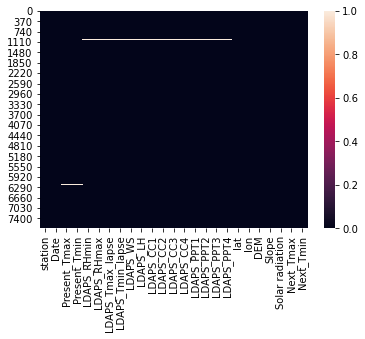

In [10]:
import seaborn as sns
sns.heatmap(df.isnull())

Observations:
    
    1.Nan values are present in dataset.

# Drop NaN/Null values

In [11]:
df = df.dropna().reset_index()

In [12]:
df.isnull().sum()

index               0
station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

<AxesSubplot:>

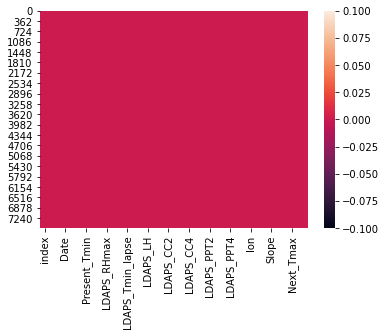

In [13]:
sns.heatmap(df.isnull())

# Univariate analysis
Univariate analysis is the simplest form of analyzing data.

#lets start with Distribution ploting.

25.0    307
18.0    307
2.0     307
17.0    307
10.0    307
23.0    307
3.0     306
4.0     306
13.0    305
16.0    304
20.0    304
21.0    304
14.0    303
1.0     303
15.0    302
12.0    302
22.0    302
9.0     302
24.0    302
19.0    302
11.0    301
7.0     301
6.0     301
8.0     300
5.0     296
Name: station, dtype: int64

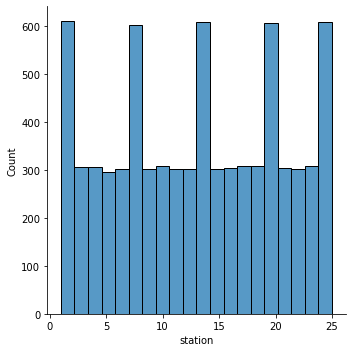

In [14]:
sns.displot(df['station'])
df.station.value_counts()

Observations:
    
    1.This feature column is not-distributed normally.

27-08-2014    25
20-08-2014    25
12-08-2016    25
05-08-2015    25
14-07-2015    25
              ..
24-07-2015    22
23-08-2017    22
06-07-2017    22
13-08-2015    22
30-06-2017    16
Name: Date, Length: 307, dtype: int64

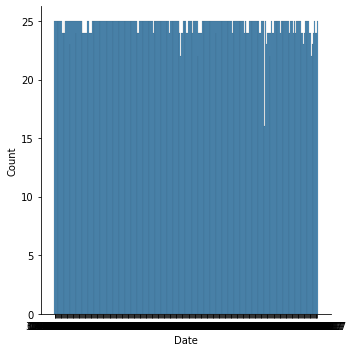

In [15]:
sns.displot(df['Date'])
df.Date.value_counts()

Observations:
    
    1.This feature column is distributed normally.

31.4    112
29.4    108
29.1    106
29.2    105
30.6    105
       ... 
20.1      1
20.4      1
37.1      1
37.6      1
21.2      1
Name: Present_Tmax, Length: 167, dtype: int64

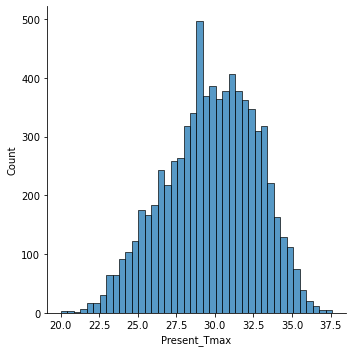

In [16]:
sns.displot(df['Present_Tmax'])
df.Present_Tmax.value_counts()

Observations:
    
    1.This feature column is distributed normally.

24.0    160
23.8    153
23.5    143
23.1    143
23.3    140
       ... 
14.1      1
14.2      1
29.7      1
29.9      1
11.3      1
Name: Present_Tmin, Length: 155, dtype: int64

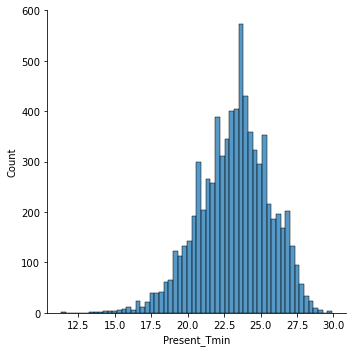

In [17]:
sns.displot(df['Present_Tmin'])
df.Present_Tmin.value_counts()

Observations:
    
    1.This feature column is distributed normally.

51.810596    2
77.030350    2
71.658089    2
43.947876    1
78.708603    1
            ..
44.005089    1
58.655628    1
58.761993    1
42.186558    1
71.359451    1
Name: LDAPS_RHmin, Length: 7585, dtype: int64

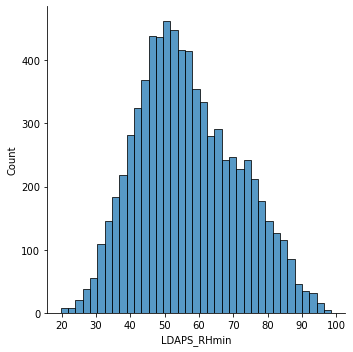

In [18]:
sns.displot(df['LDAPS_RHmin'])
df.LDAPS_RHmin.value_counts()

Observations:
    
    1.This feature column is distributed normally.

29.732836    1
28.174952    1
30.574987    1
27.753920    1
32.762753    1
            ..
28.761418    1
28.577678    1
32.972568    1
31.208222    1
27.149571    1
Name: LDAPS_Tmax_lapse, Length: 7588, dtype: int64

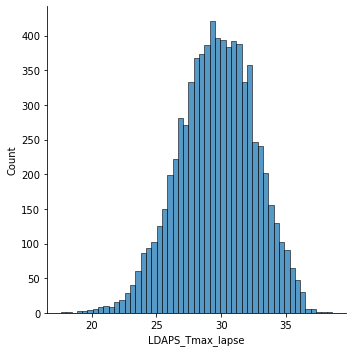

In [19]:
sns.displot(df['LDAPS_Tmax_lapse'])
df.LDAPS_Tmax_lapse.value_counts()

Observations:
    
    1.This feature column is distributed normally.

21.797430    1
21.870334    1
16.350055    1
25.728491    1
24.719108    1
            ..
20.861831    1
22.521587    1
25.165670    1
16.640794    1
23.197572    1
Name: LDAPS_Tmin_lapse, Length: 7588, dtype: int64

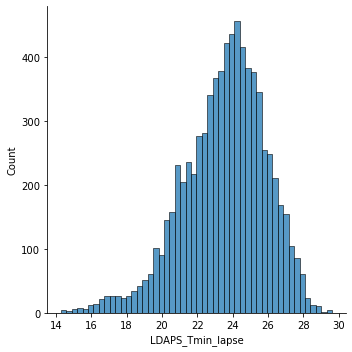

In [20]:
sns.displot(df['LDAPS_Tmin_lapse'])
df.LDAPS_Tmin_lapse.value_counts()

Observations:
    
    1.This feature column is distributed normally.

4.633030     1
6.842240     1
6.796009     1
10.157699    1
7.892052     1
            ..
8.867639     1
4.513049     1
11.098644    1
8.118150     1
8.112974     1
Name: LDAPS_WS, Length: 7588, dtype: int64

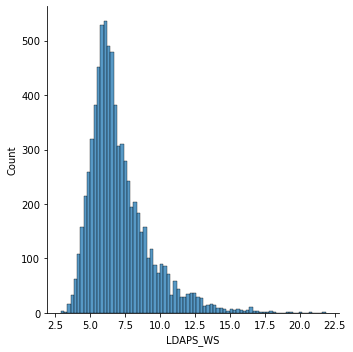

In [21]:
sns.displot(df['LDAPS_WS'])
df.LDAPS_WS.value_counts()

31.292903    1
52.898936    1
18.794811    1
58.594891    1
35.230479    1
            ..
61.306949    1
99.205233    1
10.853051    1
20.780082    1
48.865865    1
Name: LDAPS_LH, Length: 7588, dtype: int64

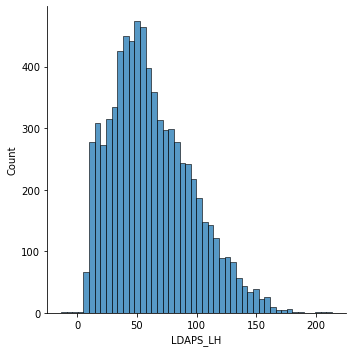

In [22]:
sns.displot(df['LDAPS_LH'])
df.LDAPS_LH.value_counts()

The history saving thread hit an unexpected error (OperationalError('database is locked')).History will not be written to the database.


0.000000    104
0.211694      1
0.081400      1
0.130883      1
0.271888      1
           ... 
0.746881      1
0.332259      1
0.917315      1
0.034681      1
0.230776      1
Name: LDAPS_CC1, Length: 7485, dtype: int64

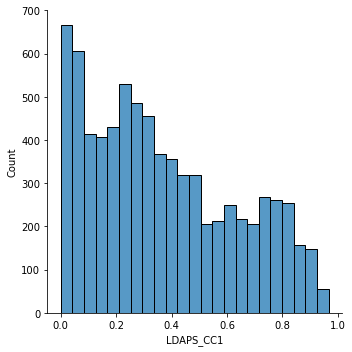

In [23]:
sns.displot(df['LDAPS_CC1'])
df.LDAPS_CC1.value_counts()

Observations:
    
    1.This feature column is not-distributed normally.

0.000000    93
0.065887     1
0.887668     1
0.808160     1
0.621571     1
            ..
0.215138     1
0.140863     1
0.079483     1
0.103516     1
0.336139     1
Name: LDAPS_CC2, Length: 7496, dtype: int64

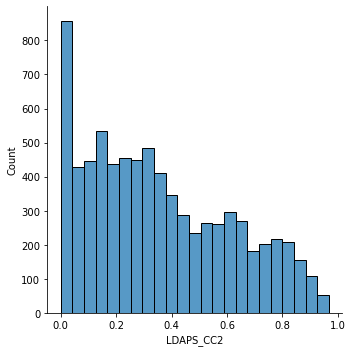

In [24]:
sns.displot(df['LDAPS_CC2'])
df.LDAPS_CC2.value_counts()

Observations:
    
    1.This feature column is not-distributed normally.

0.000000e+00    75
8.680560e-04     2
5.810000e-07     2
4.416774e-01     1
7.714030e-01     1
                ..
5.022028e-01     1
8.237407e-02     1
6.881582e-01     1
2.444761e-01     1
1.695957e-02     1
Name: LDAPS_CC3, Length: 7512, dtype: int64

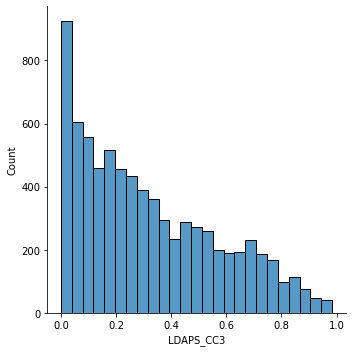

In [25]:
sns.displot(df['LDAPS_CC3'])
df.LDAPS_CC3.value_counts()

Observations:
    
    1.This feature column is not-distributed normally.

0.000000    135
0.002604      7
0.001736      3
0.005208      3
0.000001      2
           ... 
0.096646      1
0.583172      1
0.707523      1
0.135756      1
0.074535      1
Name: LDAPS_CC4, Length: 7438, dtype: int64

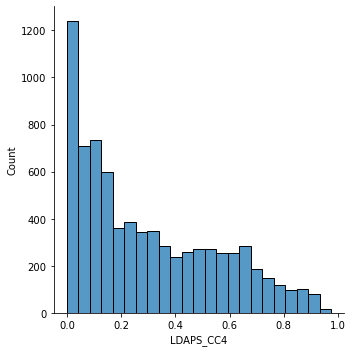

In [26]:
sns.displot(df['LDAPS_CC4'])
df.LDAPS_CC4.value_counts()

Observations:
    
    1.This feature column is not-distributed normally.

37.5776    1214
37.5507    1204
37.6181     611
37.6046     610
37.5237     609
37.5372     608
37.4967     605
37.4697     604
37.5102     603
37.4832     307
37.4562     307
37.6450     306
Name: lat, dtype: int64

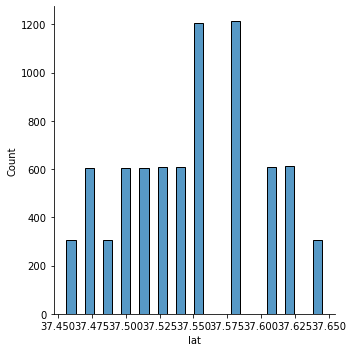

In [27]:
sns.displot(df['lat'])
df.lat.value_counts()

Observations:
    
    1.This feature column is not-distributed normally.

127.099    307
126.955    307
127.024    307
126.970    307
126.891    307
127.032    307
127.022    306
127.058    306
127.083    305
126.995    304
127.040    304
127.004    304
126.927    303
126.991    303
126.826    302
126.938    302
126.937    302
126.909    302
127.086    302
126.988    302
127.042    301
126.838    301
127.085    301
126.910    300
127.135    296
Name: lon, dtype: int64

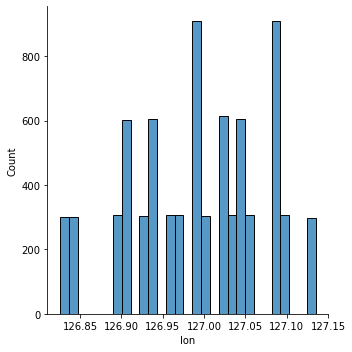

In [28]:
sns.displot(df['lon'])
df.lon.value_counts()

Observations:
    
    1.This feature column is not-distributed normally.

53.4712     307
15.5876     307
44.7624     307
56.4448     307
19.5844     307
208.5070    307
45.7160     306
33.3068     306
59.8324     305
82.2912     304
146.5540    304
26.2980     304
212.3350    303
30.9680     303
50.9312     302
21.9668     302
132.1180    302
30.0464     302
75.0924     302
17.2956     302
28.7000     301
12.3700     301
54.6384     301
52.5180     300
35.0380     296
Name: DEM, dtype: int64

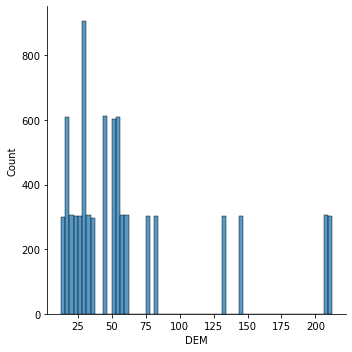

In [29]:
sns.displot(df['DEM'])
df.DEM.value_counts()

Observations:
    
    1.This feature column is not-distributed normally.

0.6970    307
1.2313    307
0.1554    307
0.5141    307
5.1782    307
0.2713    307
2.5348    306
0.2661    306
2.6865    305
4.7296    304
0.5721    304
2.2579    304
2.7850    303
0.6180    303
0.2223    302
0.4125    302
1.7678    302
0.5931    302
0.8552    302
0.1332    302
0.1457    301
0.0985    301
0.6233    301
1.5629    300
0.5055    296
Name: Slope, dtype: int64

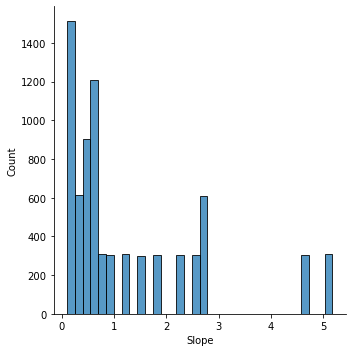

In [30]:
sns.displot(df['Slope'])
df.Slope.value_counts()

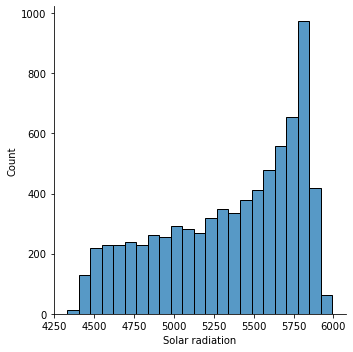

In [31]:
sns.displot(df['Solar radiation'])


Observations:
    
    1.This feature column is not-distributed normally.

# Multivariate Analysis
Multivariate analysis is a set of techniques used for analysis of data sets that contain more than one variable

In [32]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
fig = px.line(df,x = 'Date', y = ['Present_Tmax', 'Present_Tmin',], template = 'plotly_dark', title = 'Variation of Temperature with Time')
fig.show()

In [33]:
fig = px.line(df,x = 'Date', y = ['LDAPS_RHmax', 'LDAPS_RHmin'], template = 'plotly_dark', title = 'Variation of Humidity with Time')
fig.show()


In [34]:
fig = px.line(df,x = 'Date', y = ['LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4'], template = 'plotly_dark', title = 'Variation of Cloud Cover with Time')
fig.show()

In [35]:
fig = px.line(df,x = 'Date', y = ['LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4'], template = 'plotly_dark', title = 'Variation of Precipitation with Time')
fig.show()

In [36]:
fig = px.density_mapbox(df, lat='lat', lon='lon', z='Present_Tmax', hover_data=['LDAPS_RHmin', 'LDAPS_RHmax'],
                        
                        mapbox_style="stamen-terrain", template = 'plotly_dark', title = 'Maximum Temperature on Lat Long')
fig.show()

In [37]:
fig = px.density_mapbox(df, lat='lat', lon='lon', z='Present_Tmin',  hover_data=['LDAPS_RHmin', 'LDAPS_RHmax'],
                        
                        mapbox_style="stamen-terrain", template = 'plotly_dark', title = 'Minimum Temperature on Lat Long')

fig.show()

# CORRELATION BETWEEN THE COLUMNS:

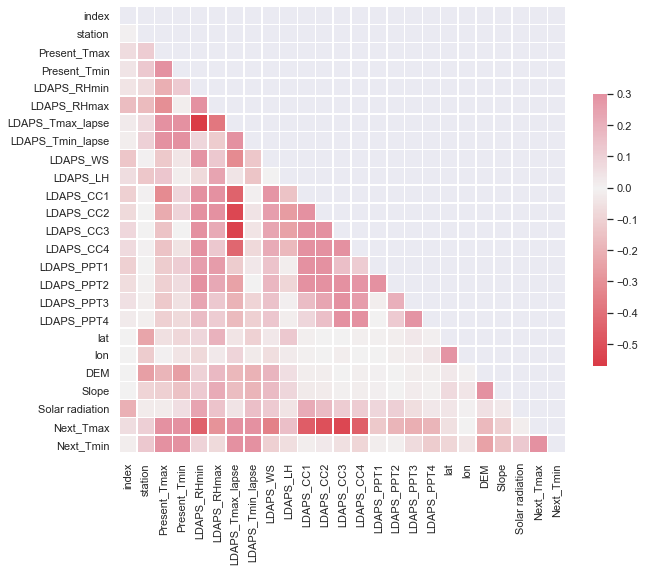

In [38]:
import matplotlib.pyplot as plt
import numpy as np
correlations = df.corr()
sns.set(style='dark')
cmap = sns.diverging_palette(10, 5, as_cmap=True)
mask = np.zeros_like(correlations, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(10,10))
sns.heatmap(correlations, mask=mask, cmap=cmap, vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

<AxesSubplot:>

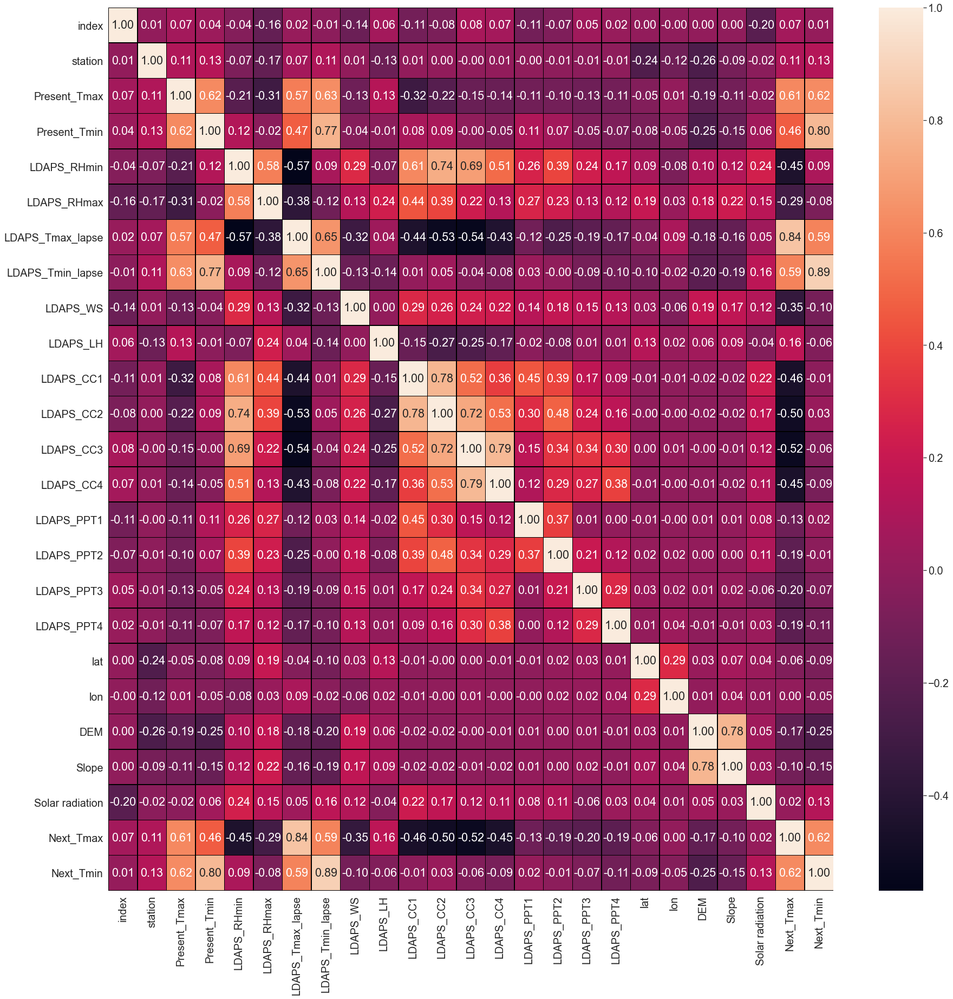

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(30,30))
sns.set(font_scale=1.8)
sns.heatmap(df.corr(), annot=True, linewidths=0.5,linecolor="black", fmt= '.2f')

Observations:

1.Feature columns are  collinear with each other; lets cheak the vif.

# Discription of dataset

In [40]:
df.describe()

,index,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,...,7588.000000,7588.000000,7588.000000,7588.000000,7588.00000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000
mean,3859.164207,13.014101,29.748366,23.195809,56.724969,88.360823,29.620128,23.511786,7.094097,62.492606,...,0.480738,0.275007,0.265373,37.544792,126.99142,61.918136,1.259755,5343.724208,30.241526,22.910820
std,2232.869924,7.217858,2.967401,2.400880,14.626559,7.199456,2.943496,2.342579,2.177034,33.686158,...,1.743327,1.146087,1.179661,0.050428,0.07922,54.323529,1.372748,429.782561,3.111807,2.482256
min,0.000000,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.456200,126.82600,12.370000,0.098500,4329.520508,17.400000,11.300000
25%,1936.750000,7.000000,27.800000,21.600000,45.960243,84.203724,27.673756,22.086820,5.675358,37.206201,...,0.000000,0.000000,0.000000,37.510200,126.93700,28.700000,0.271300,5001.485717,28.200000,21.300000
50%,3843.500000,13.000000,29.900000,23.400000,55.023199,89.784122,29.709537,23.758249,6.547838,56.898324,...,0.000000,0.000000,0.000000,37.550700,126.99500,45.716000,0.618000,5441.987305,30.400000,23.100000
75%,5781.250000,19.000000,32.000000,24.800000,67.115099,93.742725,31.711109,25.155660,8.028960,84.235666,...,0.017735,0.007855,0.000017,37.577600,127.04200,59.832400,1.767800,5729.485840,32.600000,24.600000
max,7749.000000,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.645000,127.13500,212.335000,5.178200,5992.895996,38.900000,29.800000


# PLOTTING THE DISCRIPTION OF DATASET

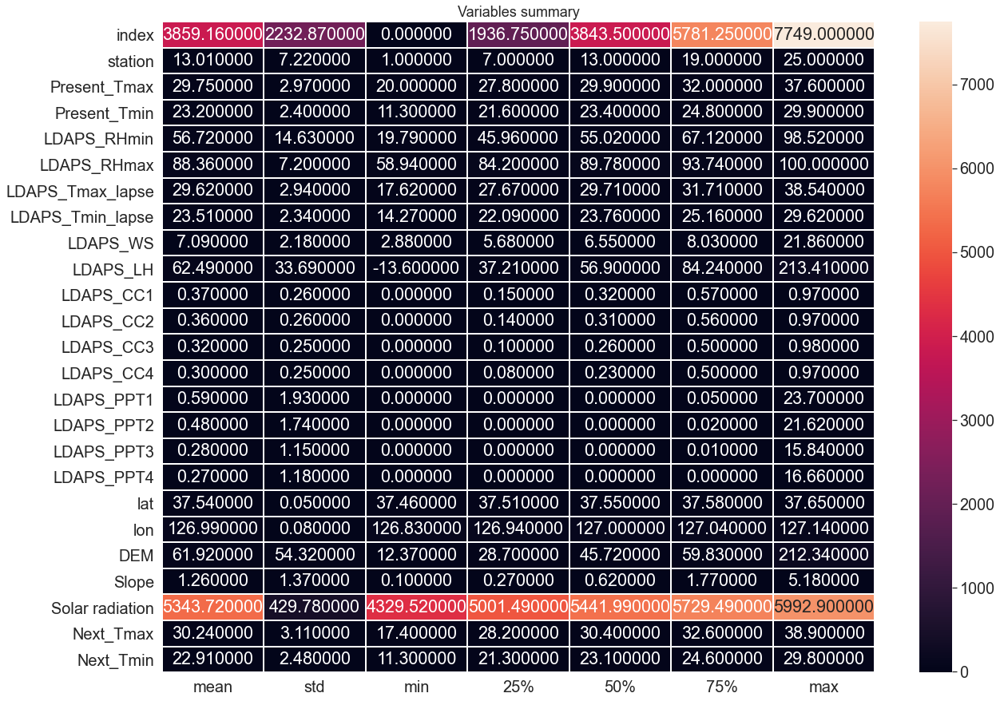

In [41]:
plt.figure(figsize=(20,15))
sns.heatmap(round(df.describe()[1:].transpose(),2),linewidth=1,annot=True,fmt="f")
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
sns.set(font_scale=1.5)
plt.title("Variables summary")
plt.show()

Observations:
    
    1.From above plotting we can find mean,std,min,25%,50%,75% and max data of the following dataset.

# Principal component analysis
Principal component analysis (PCA) is the process of computing the principal components. and cheak the collinearity.

In [42]:
df = df.drop(['Date', 'index'], axis = 1)

In [43]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [44]:
x=df.drop(['Next_Tmax','Next_Tmin'], axis=1)

In [45]:
df.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [46]:
def vif_calc():
    vif=pd.DataFrame()
    vif["VIF Factor"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["features"]=x.columns
    print(vif)

In [47]:
vif_calc()

       VIF Factor          features
0        5.101458           station
1      286.103637      Present_Tmax
2      297.622505      Present_Tmin
3      102.831448       LDAPS_RHmin
4      337.576103       LDAPS_RHmax
5      753.026423  LDAPS_Tmax_lapse
6      744.314089  LDAPS_Tmin_lapse
7       14.660651          LDAPS_WS
8        6.798021          LDAPS_LH
9       10.419600         LDAPS_CC1
10      15.064783         LDAPS_CC2
11      13.655486         LDAPS_CC3
12       7.136993         LDAPS_CC4
13       1.546441        LDAPS_PPT1
14       1.570103        LDAPS_PPT2
15       1.336008        LDAPS_PPT3
16       1.333266        LDAPS_PPT4
17  652728.518958               lat
18  650248.807653               lon
19       7.271703               DEM
20       5.475631             Slope
21     191.965287   Solar radiation


In [48]:
df1 = df.drop(['LDAPS_Tmax_lapse','lat'], axis=1)

In [49]:
df1

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,28.7,21.4,58.255688,91.116364,23.006936,6.818887,69.451805,0.233947,0.203896,...,0.0,0.0,0.0,0.0,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,31.9,21.6,52.263397,90.604721,24.035009,5.691890,51.937448,0.225508,0.251771,...,0.0,0.0,0.0,0.0,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,31.6,23.3,48.690479,83.973587,24.565633,6.138224,20.573050,0.209344,0.257469,...,0.0,0.0,0.0,0.0,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,32.0,23.4,58.239788,96.483688,23.326177,5.650050,65.727144,0.216372,0.226002,...,0.0,0.0,0.0,0.0,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,31.4,21.9,56.174095,90.155128,23.486480,5.735004,107.965535,0.151407,0.249995,...,0.0,0.0,0.0,0.0,127.135,35.0380,0.5055,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7583,21.0,23.1,17.8,24.688997,78.261383,18.303014,6.603253,9.614074,0.052902,0.030169,...,0.0,0.0,0.0,0.0,127.040,26.2980,0.5721,4456.024414,27.6,17.7
7584,22.0,22.5,17.4,30.094858,83.690018,17.814038,5.768083,82.146707,0.066461,0.024518,...,0.0,0.0,0.0,0.0,127.086,21.9668,0.1332,4441.803711,28.0,17.1
7585,23.0,23.3,17.1,26.741310,78.869858,18.775678,6.148918,72.058294,0.030034,0.081035,...,0.0,0.0,0.0,0.0,126.891,15.5876,0.1554,4443.313965,28.3,18.1
7586,24.0,23.3,17.7,24.040634,77.294975,18.733519,6.542819,47.241457,0.035874,0.074962,...,0.0,0.0,0.0,0.0,126.909,17.2956,0.2223,4438.373535,28.6,18.8


we drop highly correlated columns..

# Checking the Correlation Matrix
After dropping highly negative and correlated variables now let's check the correlation matrix again

<AxesSubplot:>

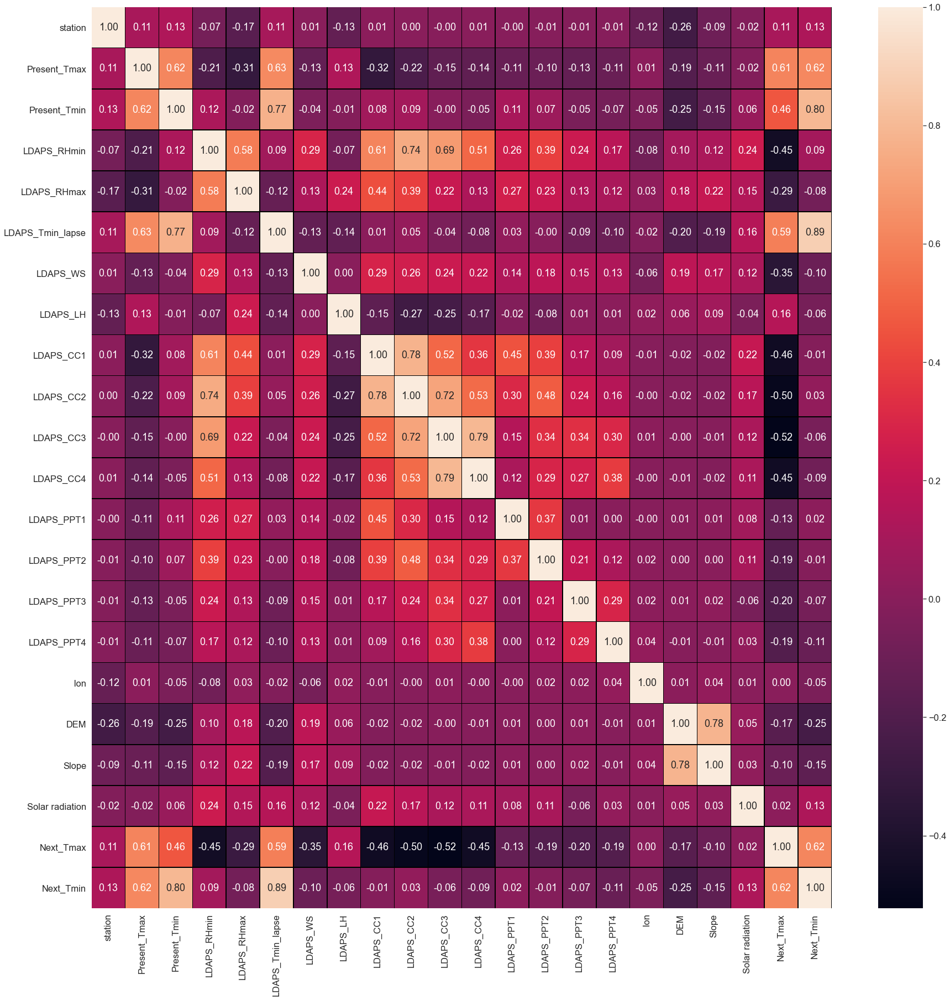

In [50]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(30,30))
sns.set(font_scale=1.5)
sns.heatmap(df1.corr(), annot=True, linewidths=0.5,linecolor="black", fmt= '.2f')

In [51]:
x=df1.drop(['Next_Tmax','Next_Tmin'], axis=1)

In [52]:
def vif_calc():
    vif=pd.DataFrame()
    vif["VIF Factor"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["features"]=x.columns
    print(vif)

In [53]:
vif_calc()

    VIF Factor          features
0     4.935996           station
1   285.437774      Present_Tmax
2   297.456611      Present_Tmin
3    66.463901       LDAPS_RHmin
4   332.577589       LDAPS_RHmax
5   361.048098  LDAPS_Tmin_lapse
6    14.455002          LDAPS_WS
7     6.746781          LDAPS_LH
8    10.327492         LDAPS_CC1
9    14.717806         LDAPS_CC2
10   13.545090         LDAPS_CC3
11    7.133144         LDAPS_CC4
12    1.529597        LDAPS_PPT1
13    1.565272        LDAPS_PPT2
14    1.313033        LDAPS_PPT3
15    1.330624        LDAPS_PPT4
16  596.608941               lon
17    7.164697               DEM
18    5.418310             Slope
19  179.931084   Solar radiation


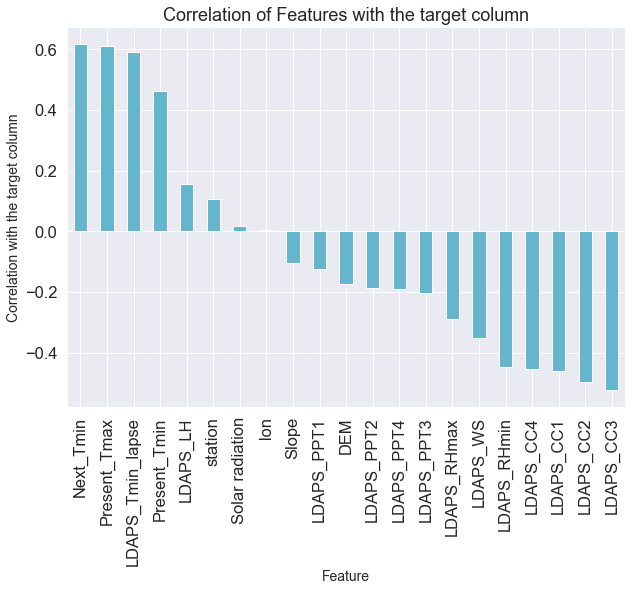

In [54]:
plt.figure(figsize=(10,7))
df1.corr()['Next_Tmax'].sort_values(ascending=False).drop(['Next_Tmax']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Correlation with the target column',fontsize=14)
plt.title('Correlation of Features with the target column',fontsize=18)
plt.show()


Observations:
    1.  max temperature.
   2.Some columns making positive impacting on target columns,positive columns are help model to learn more accurate. 

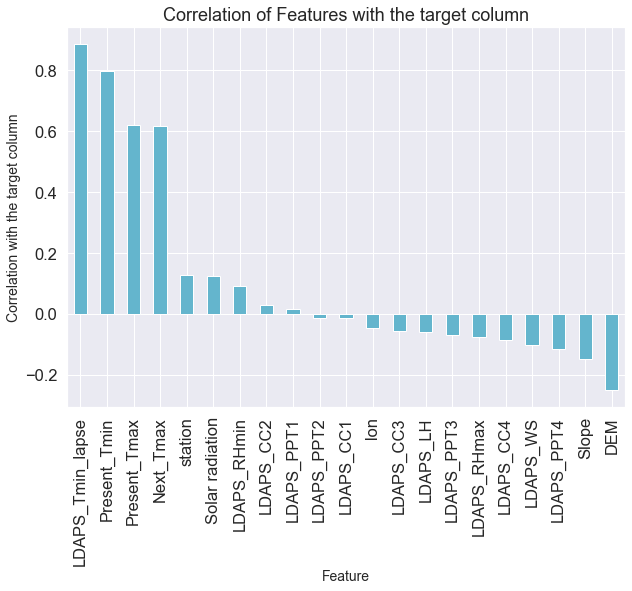

In [55]:
plt.figure(figsize=(10,7))
df1.corr()['Next_Tmin'].sort_values(ascending=False).drop(['Next_Tmin']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Correlation with the target column',fontsize=14)
plt.title('Correlation of Features with the target column',fontsize=18)
plt.show()


Observations:
    1.  minimum temperature.
    
    2.Some columns making positive impacting on target columns,positive columns are help model to learn more accurate.

array([[<AxesSubplot:title={'center':'station'}>,
        <AxesSubplot:title={'center':'Present_Tmax'}>,
        <AxesSubplot:title={'center':'Present_Tmin'}>,
        <AxesSubplot:title={'center':'LDAPS_RHmin'}>,
        <AxesSubplot:title={'center':'LDAPS_RHmax'}>],
       [<AxesSubplot:title={'center':'LDAPS_Tmax_lapse'}>,
        <AxesSubplot:title={'center':'LDAPS_Tmin_lapse'}>,
        <AxesSubplot:title={'center':'LDAPS_WS'}>,
        <AxesSubplot:title={'center':'LDAPS_LH'}>,
        <AxesSubplot:title={'center':'LDAPS_CC1'}>],
       [<AxesSubplot:title={'center':'LDAPS_CC2'}>,
        <AxesSubplot:title={'center':'LDAPS_CC3'}>,
        <AxesSubplot:title={'center':'LDAPS_CC4'}>,
        <AxesSubplot:title={'center':'LDAPS_PPT1'}>,
        <AxesSubplot:title={'center':'LDAPS_PPT2'}>],
       [<AxesSubplot:title={'center':'LDAPS_PPT3'}>,
        <AxesSubplot:title={'center':'LDAPS_PPT4'}>,
        <AxesSubplot:title={'center':'lat'}>,
        <AxesSubplot:title={'center':'lon'}

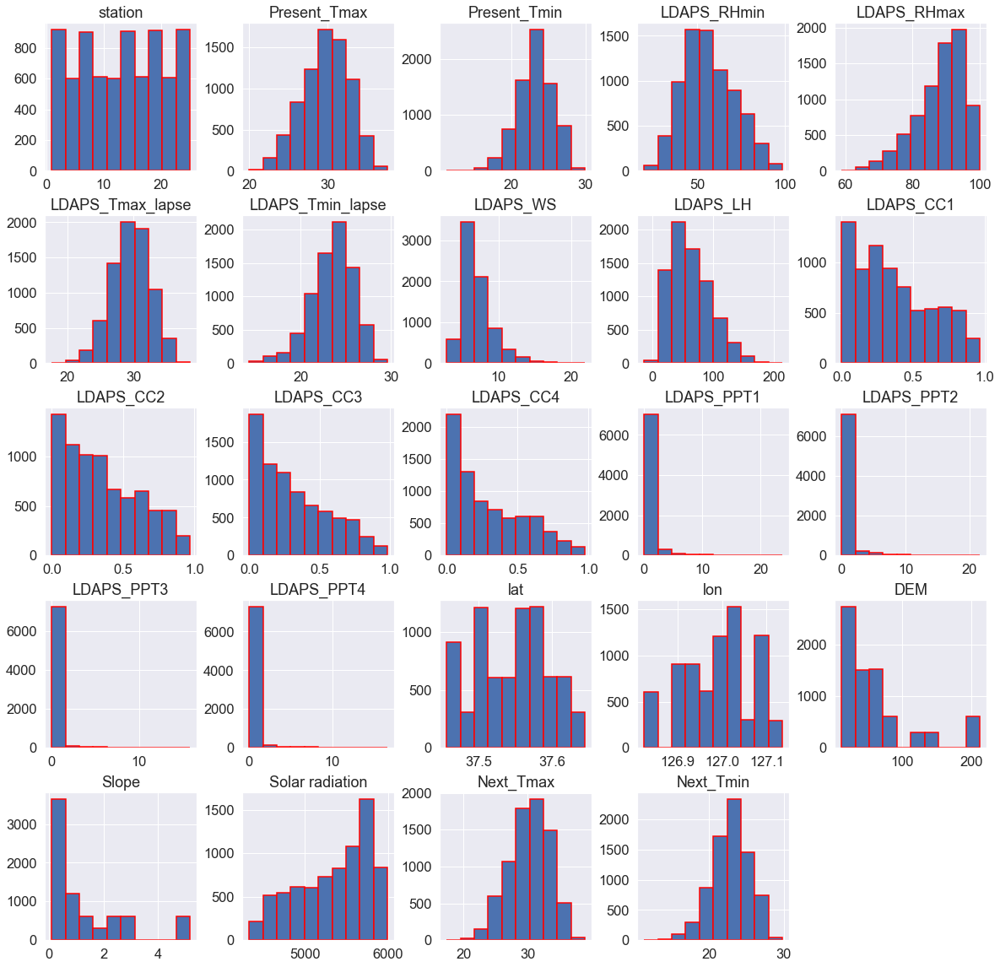

In [56]:
df.hist(edgecolor='red',linewidth=1.5,figsize=(20,20))

observations:
    
    1.Data is skewed towards right

# Cheak the skewness:
Now use subplot and displot to check data are normalised or not.

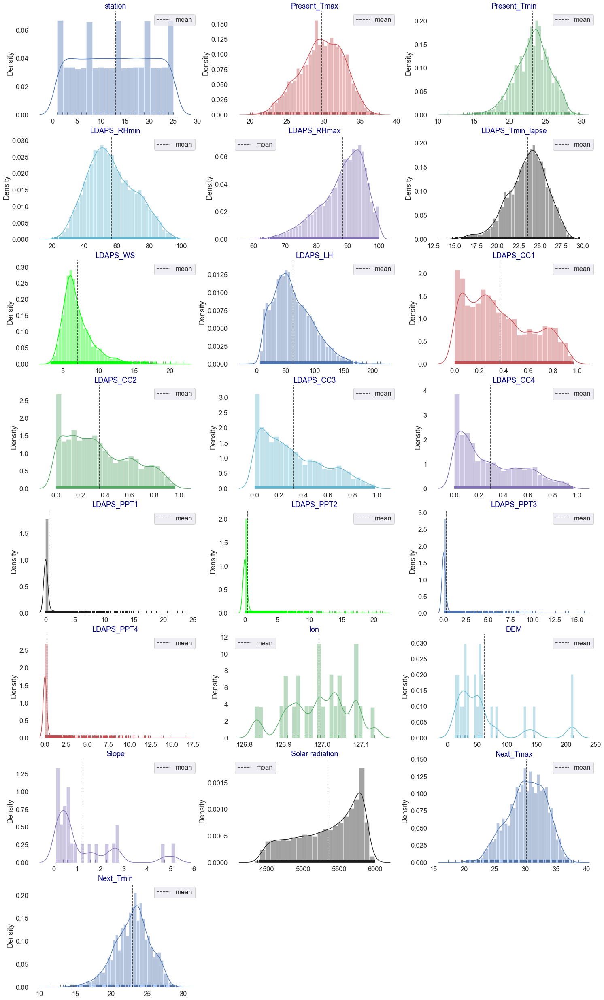

In [57]:
import itertools
import matplotlib.pyplot as plt
cols = ['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2',
       'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3',
       'LDAPS_PPT4', 'lon', 'DEM', 'Slope', 'Solar radiation', 'Next_Tmax',
       'Next_Tmin']
length = len(cols)
cs = ["b","r","g","c","m","k",'lime',"b","r","g","c","m","k",'lime',"b","r","g","c","m","k"]
fig = plt.figure(figsize=(25,50))

for i,j,k in itertools.zip_longest(cols,range(length),cs):
    plt.subplot(9,3,j+1)
    ax = sns.distplot(df[i],color=k,rug=True)
    ax.set_facecolor("w")
    plt.axvline(df[i].mean(),linestyle="dashed",label="mean",color="k")
    plt.legend(loc="best")
    plt.title(i,color="navy")
    plt.xlabel("")

Observations:
    
    1. we predicted right data is skewed towards right,
    
    2. data is not scaled.

In [59]:
df1.skew()

station            -0.004178
Present_Tmax       -0.257069
Present_Tmin       -0.353822
LDAPS_RHmin         0.301396
LDAPS_RHmax        -0.845264
LDAPS_Tmin_lapse   -0.574035
LDAPS_WS            1.553926
LDAPS_LH            0.662971
LDAPS_CC1           0.456716
LDAPS_CC2           0.473929
LDAPS_CC3           0.639649
LDAPS_CC4           0.663815
LDAPS_PPT1          5.305906
LDAPS_PPT2          5.710360
LDAPS_PPT3          6.356670
LDAPS_PPT4          6.681256
lon                -0.289048
DEM                 1.721617
Slope               1.559050
Solar radiation    -0.524325
Next_Tmax          -0.334842
Next_Tmin          -0.393662
dtype: float64

# Detecting outliers:

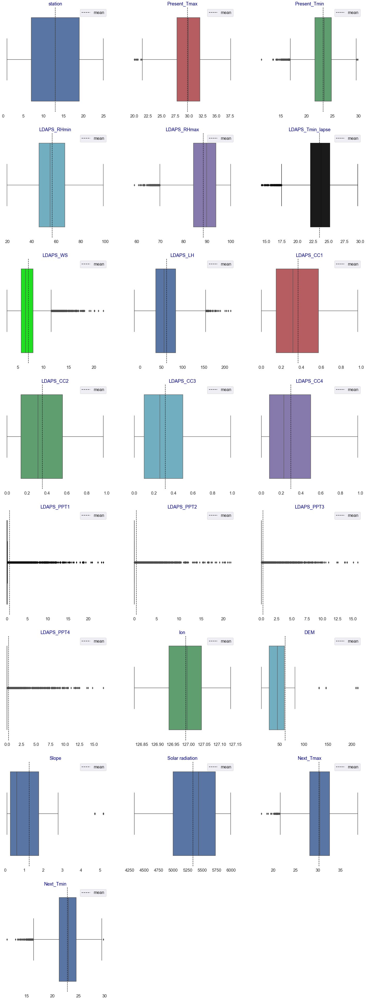

In [60]:
import itertools
import matplotlib.pyplot as plt
cols = ['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2',
       'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3',
       'LDAPS_PPT4', 'lon', 'DEM', 'Slope', 'Solar radiation', 'Next_Tmax',
       'Next_Tmin']
length = len(cols)
cs = ["b","r","g","c","m","k",'lime',"b","r","g","c","m","k",'lime',"b","r","g","c"]
fig = plt.figure(figsize=(25,70))

for i,j,k in itertools.zip_longest(cols,range(length),cs):
    plt.subplot(8,3,j+1)
    ax = sns.boxplot(df1[i],color=k)
    ax.set_facecolor("w")
    plt.axvline(df1[i].mean(),linestyle="dashed",label="mean",color="k")
    plt.legend(loc="best")
    plt.title(i,color="navy")
    plt.xlabel("")

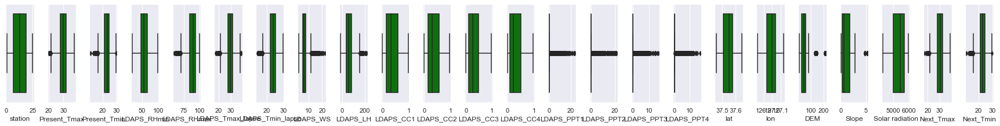

In [61]:
collist=df.columns.values
ncol=30
nrows=30
sns.set(font_scale=1)
plt.figure(figsize=(ncol,3*(ncol)))
for i in range (0, len(collist)):
    plt.subplot(nrows,ncol,i+5)
    sns.boxplot(df[collist[i]],color='green')
    plt.tight_layout()


Observations:
    1. from above ploting outliers are present in datasets,
    
    2. lets remove them using z-score.

# Check the percentage of data falls under outliers:

In [62]:
from scipy.stats import zscore
import numpy as np
z=np.abs(zscore(df1))
threshold=3
np.where(z>3)

(array([  25,   25,   26, ..., 7581, 7582, 7582], dtype=int64),
 array([ 6, 13, 13, ...,  2,  2,  5], dtype=int64))

In [63]:
df_new=df1[(z<3).all(axis=1)]
df_new

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,28.7,21.4,58.255688,91.116364,23.006936,6.818887,69.451805,0.233947,0.203896,...,0.0,0.0,0.0,0.0,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,31.9,21.6,52.263397,90.604721,24.035009,5.691890,51.937448,0.225508,0.251771,...,0.0,0.0,0.0,0.0,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,31.6,23.3,48.690479,83.973587,24.565633,6.138224,20.573050,0.209344,0.257469,...,0.0,0.0,0.0,0.0,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,32.0,23.4,58.239788,96.483688,23.326177,5.650050,65.727144,0.216372,0.226002,...,0.0,0.0,0.0,0.0,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,31.4,21.9,56.174095,90.155128,23.486480,5.735004,107.965535,0.151407,0.249995,...,0.0,0.0,0.0,0.0,127.135,35.0380,0.5055,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7583,21.0,23.1,17.8,24.688997,78.261383,18.303014,6.603253,9.614074,0.052902,0.030169,...,0.0,0.0,0.0,0.0,127.040,26.2980,0.5721,4456.024414,27.6,17.7
7584,22.0,22.5,17.4,30.094858,83.690018,17.814038,5.768083,82.146707,0.066461,0.024518,...,0.0,0.0,0.0,0.0,127.086,21.9668,0.1332,4441.803711,28.0,17.1
7585,23.0,23.3,17.1,26.741310,78.869858,18.775678,6.148918,72.058294,0.030034,0.081035,...,0.0,0.0,0.0,0.0,126.891,15.5876,0.1554,4443.313965,28.3,18.1
7586,24.0,23.3,17.7,24.040634,77.294975,18.733519,6.542819,47.241457,0.035874,0.074962,...,0.0,0.0,0.0,0.0,126.909,17.2956,0.2223,4438.373535,28.6,18.8


In [64]:
df.shape

(7588, 24)

In [65]:
df_new.shape

(6740, 22)

In [66]:
percentage_loss=((7588-6740)/7588)*100
print(percentage_loss)

11.17554032683184


# Split the dataset in input columns and target columns..


In [67]:
x=df_new.drop(['Next_Tmax','Next_Tmin'], axis=1)
x.shape

(6740, 20)

In [68]:
y1=df_new['Next_Tmax']

In [69]:
y1.shape

(6740,)

In [70]:
y2=df_new['Next_Tmin']


In [71]:
y2.shape

(6740,)

# Removing skewness by transforming data.

In [72]:
from sklearn.preprocessing import power_transform
x=power_transform(x,method='yeo-johnson')
x

array([[-1.86897485, -0.47252289, -0.83444707, ...,  1.85438134,
         1.32790131,  1.89182066],
       [-1.65765198,  0.67102015, -0.75241647, ...,  0.06993079,
        -0.37567289,  1.43119554],
       [-1.46450869,  0.55839779, -0.0309008 , ..., -0.35320354,
        -0.94400101,  1.41062806],
       ...,
       [ 1.30738849, -2.11557011, -2.4503978 , ..., -1.57644015,
        -1.27844454, -1.77951451],
       [ 1.42280125, -2.11557011, -2.24204958, ..., -1.39733737,
        -1.0689237 , -1.78556743],
       [ 1.53700112, -2.14263323, -2.34692655, ..., -1.18802792,
        -0.92975432, -1.7696194 ]])

In [73]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)
x

array([[-1.86897485, -0.47252289, -0.83444707, ...,  1.85438134,
         1.32790131,  1.89182066],
       [-1.65765198,  0.67102015, -0.75241647, ...,  0.06993079,
        -0.37567289,  1.43119554],
       [-1.46450869,  0.55839779, -0.0309008 , ..., -0.35320354,
        -0.94400101,  1.41062806],
       ...,
       [ 1.30738849, -2.11557011, -2.4503978 , ..., -1.57644015,
        -1.27844454, -1.77951451],
       [ 1.42280125, -2.11557011, -2.24204958, ..., -1.39733737,
        -1.0689237 , -1.78556743],
       [ 1.53700112, -2.14263323, -2.34692655, ..., -1.18802792,
        -0.92975432, -1.7696194 ]])

# Since the column has binary variable we will use linear Regression


# Regression Model Building:
Linear Regression:

Y1=Next_Tmax

Y2=Next_Tmin

# Y1=Next_Tmax
 

In [74]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
from sklearn.metrics import r2_score


In [75]:
max_scr=0
for i in range(0,1000):
    xtrain,xtest,y1train,y1test=train_test_split(x,y1,random_state=i,test_size=0.20)
    lr.fit(xtrain,y1train)
    pred_train=lr.predict(xtrain)
    pred_test=lr.predict(xtest)
    #if round(r2_score(y1train,pred_train)*100,2)==round(r2_score(y1test,pred_test)*100,2):
    print("At random state",i," The model performs very well")
    print("At random_state:-",i)
    print("Training r2_score is:-", r2_score(y1train,pred_train)*100)
    print("Testing r2_score is:-", r2_score(y1test,pred_test)*100)

At random state 0  The model performs very well
At random_state:- 0
Training r2_score is:- 70.92346644809436
Testing r2_score is:- 70.16085084978332
At random state 1  The model performs very well
At random_state:- 1
Training r2_score is:- 71.10722554330931
Testing r2_score is:- 69.33976603039594
At random state 2  The model performs very well
At random_state:- 2
Training r2_score is:- 70.71935084013505
Testing r2_score is:- 70.93072277169212
At random state 3  The model performs very well
At random_state:- 3
Training r2_score is:- 70.87998465666819
Testing r2_score is:- 70.30111223738452
At random state 4  The model performs very well
At random_state:- 4
Training r2_score is:- 71.50867250604294
Testing r2_score is:- 67.30115137380366
At random state 5  The model performs very well
At random_state:- 5
Training r2_score is:- 71.00201175698501
Testing r2_score is:- 69.6953453335284
At random state 6  The model performs very well
At random_state:- 6
Training r2_score is:- 70.7508443152091

At random_state:- 68
Training r2_score is:- 70.71103352633983
Testing r2_score is:- 70.9310985401348

In [76]:
xtrain,xtest,y1train,y1test=train_test_split(x,y1,test_size=.20,random_state=68)

In [77]:
lr=LinearRegression()
lr.fit(xtrain,y1train)
lr.score(xtrain,y1train)

pred_test1=lr.predict(xtest)

from sklearn.metrics import accuracy_score
r2_score(y1test,pred_test1)


0.709310985401348

In [78]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings('ignore')

In [79]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
import numpy as np

In [80]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y1test,pred_test))
print('Mean Squared Error:',mean_squared_error(y1test,pred_test))
print('Root Mean Square Error:',np.sqrt(mean_squared_error(y1test,pred_test)))

Error:
Mean Absolute Error: 3.036110345560283
Mean Squared Error: 14.182425778262434
Root Mean Square Error: 3.7659561572411375


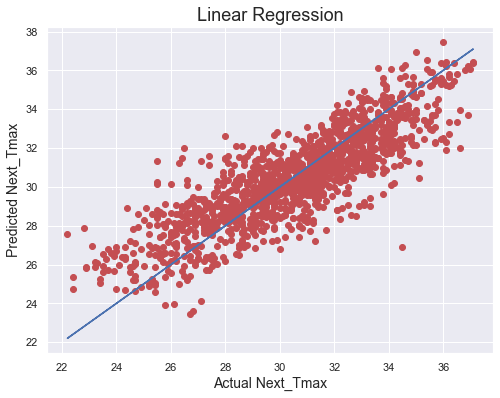

In [81]:
plt.figure(figsize=(8,6))
plt.scatter(x=y1test, y=pred_test1, color='r')
plt.plot(y1test,y1test, color='b')
plt.xlabel('Actual Next_Tmax',fontsize=14)
plt.ylabel('Predicted Next_Tmax',fontsize=14)
plt.title('Linear Regression',fontsize=18)
plt.show()

# Y2=Next_Tmin

In [82]:
max_scr=0
for i in range(0,1000):
    xtrain,xtest,y2train,y2test=train_test_split(x,y2,random_state=i,test_size=0.20)
    lr.fit(xtrain,y2train)
    pred_train=lr.predict(xtrain)
    pred_test2=lr.predict(xtest)
    #if round(r2_score(y1train,pred_train)*100,)==round(r2_score(y1test,pred_test)*100,1):
    print("At random state",i," The model performs very well")
    print("At random_state:-",i)
    print("Training r2_score is:-", r2_score(y2train,pred_train)*100)
    print("Testing r2_score is:-", r2_score(y2test,pred_test2)*100)

At random state 0  The model performs very well
At random_state:- 0
Training r2_score is:- 81.62641373124026
Testing r2_score is:- 82.02343962744814
At random state 1  The model performs very well
At random_state:- 1
Training r2_score is:- 82.21706656131107
Testing r2_score is:- 79.48099100211692
At random state 2  The model performs very well
At random_state:- 2
Training r2_score is:- 81.41533761690096
Testing r2_score is:- 82.91085313143752
At random state 3  The model performs very well
At random_state:- 3
Training r2_score is:- 81.95458139461866
Testing r2_score is:- 80.61344597867858
At random state 4  The model performs very well
At random_state:- 4
Training r2_score is:- 82.18517149221373
Testing r2_score is:- 79.73346283672194
At random state 5  The model performs very well
At random_state:- 5
Training r2_score is:- 81.7574755789533
Testing r2_score is:- 81.51772533921284
At random state 6  The model performs very well
At random_state:- 6
Training r2_score is:- 81.7659877862826

At random state 106  The model performs very well

At random_state:- 106

Training r2_score is:- 81.27979377288744

Testing r2_score is:- 83.45650035194629

In [83]:
xtrain,xtest,y2train,y2test=train_test_split(x,y2,test_size=.20,random_state=106)

In [84]:
lr=LinearRegression()
lr.fit(xtrain,y2train)
lr.score(xtrain,y2train)

pred_test2=lr.predict(xtest)

from sklearn.metrics import accuracy_score
r2_score(y2test,pred_test2)


0.8345650035194628

In [85]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y2test,pred_test2))
print('Mean Squared Error:',mean_squared_error(y2test,pred_test2))
print('Root Mean Square Error:',np.sqrt(mean_squared_error(y2test,pred_test2)))

Error:
Mean Absolute Error: 0.7582466097486712
Mean Squared Error: 0.9213193978442367
Root Mean Square Error: 0.9598538419177353


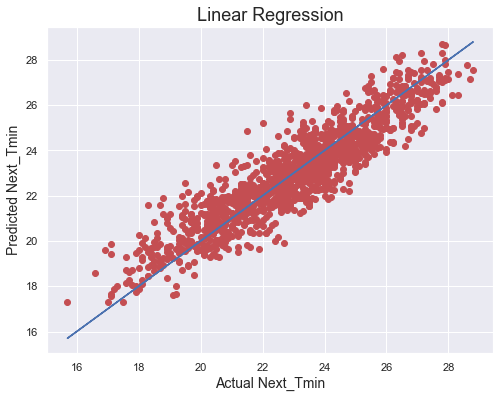

In [86]:
plt.figure(figsize=(8,6))
plt.scatter(x=y2test, y=pred_test2, color='r')
plt.plot(y2test,y2test, color='b')
plt.xlabel('Actual Next_Tmin',fontsize=14)
plt.ylabel('Predicted Next_Tmin',fontsize=14)
plt.title('Linear Regression',fontsize=18)
plt.show()

# Regurlarization
As we can easily analyis that data is not correctely fit in our model lets do some regurlization.

# 1. Lasso

# Y1=Next_Tmax
 

In [87]:
from sklearn.linear_model import Lasso

parameters = {'alpha':[.0001, .001, .01, .1, 1, 10],'random_state':list(range(0,10))}
ls = Lasso()
clf = GridSearchCV(ls,parameters)
clf.fit(xtrain,y1train)

print(clf.best_params_)

{'alpha': 1, 'random_state': 0}


In [88]:
ls = Lasso(alpha=1,random_state=0)
ls.fit(xtrain,y1train)
ls.score(xtrain,y1train)
pred_ls1 = ls.predict(xtest)

lss = r2_score(y1test,pred_ls1)
for j in range(2,10):
    lsscore = cross_val_score(ls,x,y1,cv=j)
    lsc = lsscore.mean() 
    print("At cv:-",j)
    print("Cross validation score is:-",lsc*100 )
    print("R2_score is :-",lss*100)
    print("\n")

At cv:- 2
Cross validation score is:- 14.092419484299151
R2_score is :- -0.00047237811098277405


At cv:- 3
Cross validation score is:- 25.02953331406932
R2_score is :- -0.00047237811098277405


At cv:- 4
Cross validation score is:- 25.750426044711094
R2_score is :- -0.00047237811098277405


At cv:- 5
Cross validation score is:- 24.98387749172198
R2_score is :- -0.00047237811098277405


At cv:- 6
Cross validation score is:- 23.43752212165897
R2_score is :- -0.00047237811098277405


At cv:- 7
Cross validation score is:- 23.739179576077102
R2_score is :- -0.00047237811098277405


At cv:- 8
Cross validation score is:- 23.22353056578857
R2_score is :- -0.00047237811098277405


At cv:- 9
Cross validation score is:- 9.846594449996454
R2_score is :- -0.00047237811098277405




In [89]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y1test,pred_ls1))
print('Mean Squared Error:',mean_squared_error(y1test,pred_ls1))
print('Root Mean Square Error:',np.sqrt(mean_squared_error(y1test,pred_ls1)))

Error:
Mean Absolute Error: 2.422069787970309
Mean Squared Error: 8.716953252262941
Root Mean Square Error: 2.952448687490257


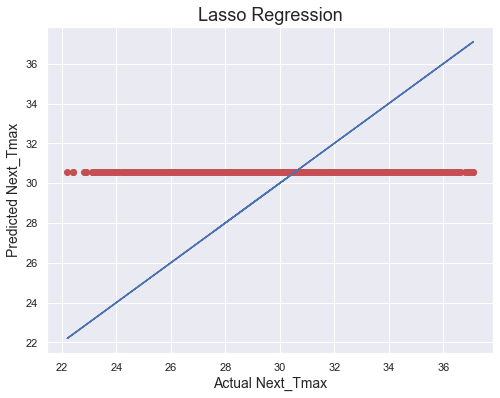

In [90]:
plt.figure(figsize=(8,6))
plt.scatter(x=y1test, y=pred_ls1, color='r')
plt.plot(y1test,y1test, color='b')
plt.xlabel('Actual Next_Tmax',fontsize=14)
plt.ylabel('Predicted Next_Tmax',fontsize=14)
plt.title('Lasso Regression',fontsize=18)
plt.show()

# Y2=Next_Tmin

In [91]:
from sklearn.linear_model import Lasso

parameters = {'alpha':[.0001, .001, .01, .1, 1, 10],'random_state':list(range(0,10))}
ls = Lasso()
clf = GridSearchCV(ls,parameters)
clf.fit(xtrain,y2train)

print(clf.best_params_)

{'alpha': 0.001, 'random_state': 0}


In [92]:
ls = Lasso(alpha=.001,random_state=0)
ls.fit(xtrain,y2train)
ls.score(xtrain,y2train)
pred_ls2 = ls.predict(xtest)

lss = r2_score(y2test,pred_ls2)
for j in range(2,10):
    lsscore = cross_val_score(ls,x,y2,cv=j)
    lsc = lsscore.mean() 
    print("At cv:-",j)
    print("Cross validation score is:-",lsc*100 )
    print("R2_score is :-",lss*100)
    print("\n")

At cv:- 2
Cross validation score is:- 79.40357052707347
R2_score is :- 83.45720599783519


At cv:- 3
Cross validation score is:- 76.44690199527021
R2_score is :- 83.45720599783519


At cv:- 4
Cross validation score is:- 77.59039117504803
R2_score is :- 83.45720599783519


At cv:- 5
Cross validation score is:- 76.8939221211129
R2_score is :- 83.45720599783519


At cv:- 6
Cross validation score is:- 74.31646915398818
R2_score is :- 83.45720599783519


At cv:- 7
Cross validation score is:- 75.0801106340276
R2_score is :- 83.45720599783519


At cv:- 8
Cross validation score is:- 76.6862032347148
R2_score is :- 83.45720599783519


At cv:- 9
Cross validation score is:- 71.74556859807068
R2_score is :- 83.45720599783519




At cv:- 2
Cross validation score is:- 79.40357052707347
R2_score is :- 83.45720599783519

In [93]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y2test,pred_ls2))
print('Mean Squared Error:',mean_squared_error(y2test,pred_ls2))
print('Root Mean Square Error:',np.sqrt(mean_squared_error(y2test,pred_ls2)))

Error:
Mean Absolute Error: 0.7581561938911778
Mean Squared Error: 0.9212800999169976
Root Mean Square Error: 0.9598333709123671


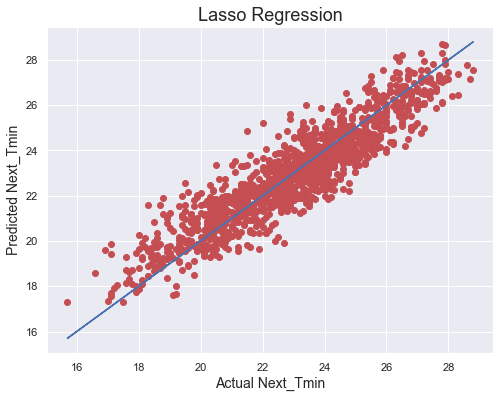

In [94]:
plt.figure(figsize=(8,6))
plt.scatter(x=y2test, y=pred_ls2, color='r')
plt.plot(y2test,y2test, color='b')
plt.xlabel('Actual Next_Tmin',fontsize=14)
plt.ylabel('Predicted Next_Tmin',fontsize=14)
plt.title('Lasso Regression',fontsize=18)
plt.show()

# 2. Ridge

# Y1=Next_Tmax


In [95]:
from sklearn.linear_model import Ridge

parameters = {'alpha':[.0001, .001, .01, .1, 1],'fit_intercept':[True,False],'normalize':[True,False],'copy_X':[True,False],'tol':[0.001,0.01,0.1],'random_state':[0,1,2,3,4,5,6,7,8,9]}
rd = Ridge()
clf = GridSearchCV(rd,parameters)
clf.fit(xtrain,y1train)

print(clf.best_params_)

{'alpha': 1, 'copy_X': True, 'fit_intercept': True, 'normalize': True, 'random_state': 0, 'tol': 0.001}


In [96]:
rd = Ridge(alpha=1, copy_X= True, fit_intercept= True, normalize=True, random_state= 0, tol= 0.001)
rd.fit(xtrain,y1train)
rd.score(xtrain,y1train)
pred_rd1 = rd.predict(xtest)
rds = r2_score(y1test,pred_rd1)
for j in range(2,10):
    rds = r2_score(y1test,pred_rd1)
    
    print("At cv:-",j)
    print('R2 Score:',rds*100)

    rdscore = cross_val_score(rd,x,y1,cv=j)
    rdc = rdscore.mean() 
    print('Cross Val Score:',rdc*100)

At cv:- 2
R2 Score: -0.14558899639640632
Cross Val Score: 56.14330809097243
At cv:- 3
R2 Score: -0.14558899639640632
Cross Val Score: 59.46103951913509
At cv:- 4
R2 Score: -0.14558899639640632
Cross Val Score: 57.801042377778714
At cv:- 5
R2 Score: -0.14558899639640632
Cross Val Score: 57.72022310080983
At cv:- 6
R2 Score: -0.14558899639640632
Cross Val Score: 56.63661412023085
At cv:- 7
R2 Score: -0.14558899639640632
Cross Val Score: 55.86978545007902
At cv:- 8
R2 Score: -0.14558899639640632
Cross Val Score: 56.1425675226195
At cv:- 9
R2 Score: -0.14558899639640632
Cross Val Score: 50.3204468574912


In [97]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y1test,pred_rd1))
print('Mean Squared Error:',mean_squared_error(y1test,pred_rd1))
print('Root Mean Square Error:',np.sqrt(mean_squared_error(y1test,pred_rd1)))

Error:
Mean Absolute Error: 2.4221384036551967
Mean Squared Error: 8.72960294028579
Root Mean Square Error: 2.9545901475984433


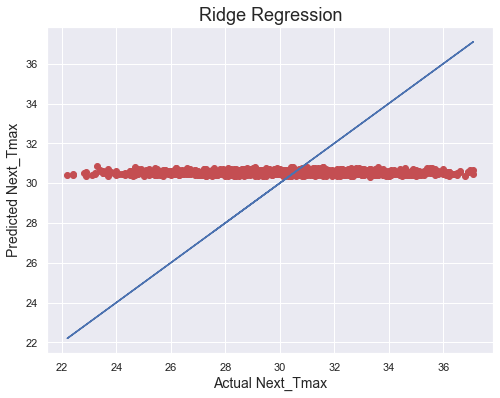

In [98]:
plt.figure(figsize=(8,6))
plt.scatter(x=y1test, y=pred_rd1, color='r')
plt.plot(y1test,y1test, color='b')
plt.xlabel('Actual Next_Tmax',fontsize=14)
plt.ylabel('Predicted Next_Tmax',fontsize=14)
plt.title('Ridge Regression',fontsize=18)
plt.show()

# Y2=Next_Tmin

In [99]:
from sklearn.linear_model import Ridge

parameters = {'alpha':[.0001, .001, .01, .1, 1],'fit_intercept':[True,False],'normalize':[True,False],'copy_X':[True,False],'tol':[0.001,0.01,0.1],'random_state':[0,1,2,3,4,5,6,7,8,9]}
rd = Ridge()
clf = GridSearchCV(rd,parameters)
clf.fit(xtrain,y2train)

print(clf.best_params_)

{'alpha': 0.001, 'copy_X': True, 'fit_intercept': True, 'normalize': True, 'random_state': 0, 'tol': 0.001}


In [100]:
rd = Ridge(alpha=0.001, copy_X= True, fit_intercept= True, normalize=True, random_state= 0, tol= 0.001)
rd.fit(xtrain,y2train)
rd.score(xtrain,y2train)
pred_rd2 = rd.predict(xtest)
rds = r2_score(y2test,pred_rd2)
for j in range(2,10):
    rds = r2_score(y2test,pred_rd2)
    
    print("At cv:-",j)
    print('R2 Score:',rds*100)

    rdscore = cross_val_score(rd,x,y2,cv=j)
    rdc = rdscore.mean() 
    print('Cross Val Score:',rdc*100)

At cv:- 2
R2 Score: 83.45352142095719
Cross Val Score: 79.39064721706914
At cv:- 3
R2 Score: 83.45352142095719
Cross Val Score: 76.43468782067482
At cv:- 4
R2 Score: 83.45352142095719
Cross Val Score: 77.56741463320711
At cv:- 5
R2 Score: 83.45352142095719
Cross Val Score: 76.86906028112371
At cv:- 6
R2 Score: 83.45352142095719
Cross Val Score: 74.27968989676822
At cv:- 7
R2 Score: 83.45352142095719
Cross Val Score: 75.06434309004973
At cv:- 8
R2 Score: 83.45352142095719
Cross Val Score: 76.65922551687821
At cv:- 9
R2 Score: 83.45352142095719
Cross Val Score: 71.69553271348693


At cv:- 2
R2 Score: 83.45352142095719
Cross Val Score: 79.39064721706914

In [101]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y2test,pred_rd2))
print('Mean Squared Error:',mean_squared_error(y2test,pred_rd2))
print('Root Mean Square Error:',np.sqrt(mean_squared_error(y2test,pred_rd2)))

Error:
Mean Absolute Error: 0.7583332876378363
Mean Squared Error: 0.9214852966542514
Root Mean Square Error: 0.9599402568151059


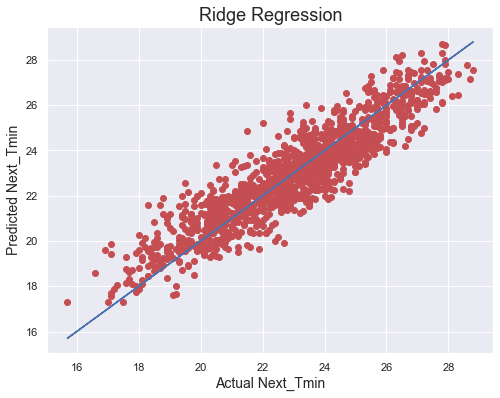

In [102]:
plt.figure(figsize=(8,6))
plt.scatter(x=y2test, y=pred_rd2, color='r')
plt.plot(y2test,y2test, color='b')
plt.xlabel('Actual Next_Tmin',fontsize=14)
plt.ylabel('Predicted Next_Tmin',fontsize=14)
plt.title('Ridge Regression',fontsize=18)
plt.show()

# Ensemble Techniques:
Decision Tree Regressor

# Y1=Next_Tmax


In [103]:
from sklearn.tree import DecisionTreeRegressor

parameters = {'criterion':['mse', 'friedman_mse', 'mae'], 'splitter':['best', 'random'], 'max_features': ['auto', 'sqrt', 'log2']}
dt =DecisionTreeRegressor()
clf = GridSearchCV(dt,parameters)
clf.fit(xtrain,y1train)

print(clf.best_params_)

{'criterion': 'mse', 'max_features': 'sqrt', 'splitter': 'best'}


In [104]:
dt = DecisionTreeRegressor(criterion='mae', splitter='random',max_features= 'sqrt')
dt.fit(xtrain,y1train)
dt.score(xtrain,y1train)
pred_decision1 = dt.predict(xtest)

dts = r2_score(y1test,pred_decision1)
for j in range(2,10):
    print("At cv:-",j)
    dts = r2_score(y1test,pred_decision1)
    print('R2 Score:',dts*100)

    dtscore = cross_val_score(dt,x,y1,cv=j)
    dtc = dtscore.mean() 
    print('Cross Val Score:',dtc*100)

At cv:- 2
R2 Score: -109.96183360373477
Cross Val Score: 14.531947439103
At cv:- 3
R2 Score: -109.96183360373477
Cross Val Score: 4.607631989196807
At cv:- 4
R2 Score: -109.96183360373477
Cross Val Score: 9.080158986955372
At cv:- 5
R2 Score: -109.96183360373477
Cross Val Score: 5.196008338984637
At cv:- 6
R2 Score: -109.96183360373477
Cross Val Score: 8.281207075801785
At cv:- 7
R2 Score: -109.96183360373477
Cross Val Score: -2.2819525802895813
At cv:- 8
R2 Score: -109.96183360373477
Cross Val Score: 1.6752812240180825
At cv:- 9
R2 Score: -109.96183360373477
Cross Val Score: -8.467760742478198


In [105]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y1test,pred_decision1))
print('Mean Squared Error:',mean_squared_error(y1test,pred_decision1))
print('Root Mean Square Error:',np.sqrt(mean_squared_error(y1test,pred_decision1)))


Error:
Mean Absolute Error: 3.4736646884273
Mean Squared Error: 18.302188427299704
Root Mean Square Error: 4.278105705484578


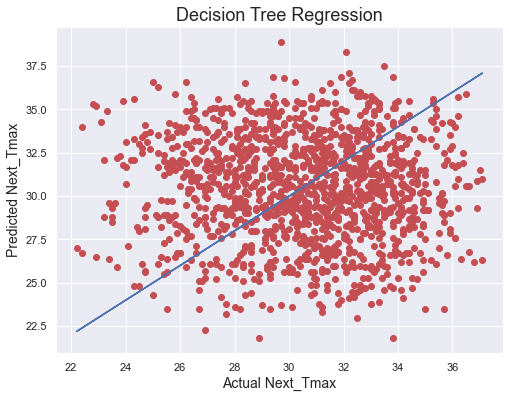

In [106]:
plt.figure(figsize=(8,6))
plt.scatter(x=y1test, y=pred_decision1, color='r')
plt.plot(y1test,y1test, color='b')
plt.xlabel('Actual Next_Tmax',fontsize=14)
plt.ylabel('Predicted Next_Tmax',fontsize=14)
plt.title('Decision Tree Regression',fontsize=18)
plt.show()

# Y2=Next_Tmin

In [107]:
from sklearn.tree import DecisionTreeRegressor

parameters = {'criterion':['mse', 'friedman_mse', 'mae'], 'splitter':['best', 'random'], 'max_features': ['auto', 'sqrt', 'log2']}
dt =DecisionTreeRegressor()
clf = GridSearchCV(dt,parameters)
clf.fit(xtrain,y2train)

print(clf.best_params_)

{'criterion': 'mse', 'max_features': 'auto', 'splitter': 'best'}


In [108]:
dt = DecisionTreeRegressor(criterion='mse', splitter='best',max_features= 'auto')
dt.fit(xtrain,y2train)
dt.score(xtrain,y2train)
pred_decision2 = dt.predict(xtest)

dts = r2_score(y2test,pred_decision2)
for j in range(2,10):
    print("At cv:-",j)
    dts = r2_score(y2test,pred_decision2)
    print('R2 Score:',dts*100)

    dtscore = cross_val_score(dt,x,y2,cv=j)
    dtc = dtscore.mean() 
    print('Cross Val Score:',dtc*100)

At cv:- 2
R2 Score: 79.50595890715421
Cross Val Score: 61.15290942336327
At cv:- 3
R2 Score: 79.50595890715421
Cross Val Score: 53.820227841487664
At cv:- 4
R2 Score: 79.50595890715421
Cross Val Score: 59.28920882071671
At cv:- 5
R2 Score: 79.50595890715421
Cross Val Score: 59.335055729396444
At cv:- 6
R2 Score: 79.50595890715421
Cross Val Score: 53.165541462979114
At cv:- 7
R2 Score: 79.50595890715421
Cross Val Score: 55.346607204471454
At cv:- 8
R2 Score: 79.50595890715421
Cross Val Score: 57.00613232672944
At cv:- 9
R2 Score: 79.50595890715421
Cross Val Score: 46.94554807864556


At cv:- 2
R2 Score: 79.33758516930813
Cross Val Score: 61.755455554904984

In [109]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y2test,pred_decision2))
print('Mean Squared Error:',mean_squared_error(y2test,pred_decision2))
print('Root Mean Square Error:',np.sqrt(mean_squared_error(y2test,pred_decision2)))


Error:
Mean Absolute Error: 0.8079376854599407
Mean Squared Error: 1.1413278931750743
Root Mean Square Error: 1.0683294871784987


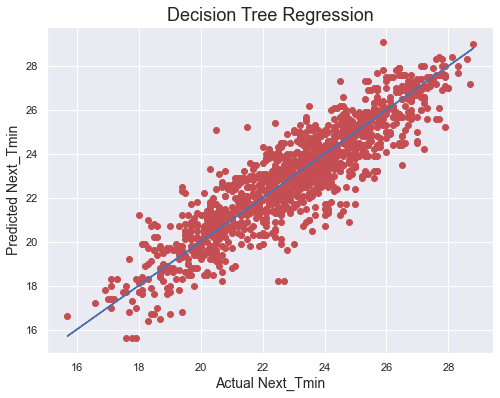

In [110]:
plt.figure(figsize=(8,6))
plt.scatter(x=y2test, y=pred_decision2, color='r')
plt.plot(y2test,y2test, color='b')
plt.xlabel('Actual Next_Tmin',fontsize=14)
plt.ylabel('Predicted Next_Tmin',fontsize=14)
plt.title('Decision Tree Regression',fontsize=18)
plt.show()

# Gradient Boosting Regressor

# Y1=Next_Tmax


In [111]:
from sklearn.datasets import make_regression
from sklearn.ensemble import GradientBoostingRegressor
parameters = {'loss' : ['ls', 'lad', 'huber', 'quantile'],'n_estimators':[50,100,200],'criterion':['friedman_mse', 'mse']}
gbr=GradientBoostingRegressor()
clf = GridSearchCV(gbr,parameters)
clf.fit(xtrain,y1train)

print(clf.best_params_)

{'criterion': 'mse', 'loss': 'ls', 'n_estimators': 50}


In [112]:
gbr= GradientBoostingRegressor(criterion='friedman_mse',loss='ls',n_estimators=50)
gbr.fit(xtrain, y1train)
gbr.score(xtrain, y1train)
pred_gradient1 = gbr.predict(xtest)

for j in range(2,10):
    print("At cv:-",j)

    gbrs= r2_score(y1test,pred_gradient1)
    print('R2 Score:',gbrs*100)

    gbscore = cross_val_score(gbr,x,y1,cv=j)
    gbrc= gbscore.mean() 
    print('Cross Val Score:',gbrc*100)

At cv:- 2
R2 Score: -1.0862050344961682
Cross Val Score: 59.30784979889274
At cv:- 3
R2 Score: -1.0862050344961682
Cross Val Score: 62.66219416030043
At cv:- 4
R2 Score: -1.0862050344961682
Cross Val Score: 60.826206800502725
At cv:- 5
R2 Score: -1.0862050344961682
Cross Val Score: 60.55175600768459
At cv:- 6
R2 Score: -1.0862050344961682
Cross Val Score: 60.60232985927999
At cv:- 7
R2 Score: -1.0862050344961682
Cross Val Score: 60.1499518561092
At cv:- 8
R2 Score: -1.0862050344961682
Cross Val Score: 59.59975944349456
At cv:- 9
R2 Score: -1.0862050344961682
Cross Val Score: 55.3728970197075


In [113]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y1test,pred_gradient1))
print('Mean Squared Error:',mean_squared_error(y1test,pred_gradient1))
print('Root Mean Square Error:',np.sqrt(mean_squared_error(y1test,pred_gradient1)))


Error:
Mean Absolute Error: 2.432892957947371
Mean Squared Error: 8.811595613294795
Root Mean Square Error: 2.9684331916509077


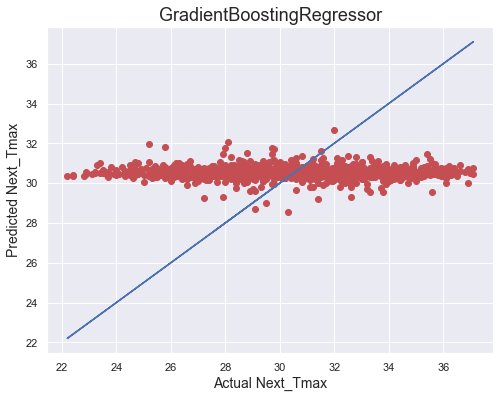

In [114]:
plt.figure(figsize=(8,6))
plt.scatter(x=y1test, y=pred_gradient1, color='r')
plt.plot(y1test,y1test, color='b')
plt.xlabel('Actual Next_Tmax',fontsize=14)
plt.ylabel('Predicted Next_Tmax',fontsize=14)
plt.title('GradientBoostingRegressor',fontsize=18)
plt.show()

# Y2=Next_Tmin

In [115]:
from sklearn.datasets import make_regression
from sklearn.ensemble import GradientBoostingRegressor
parameters = {'loss' : ['ls', 'lad', 'huber', 'quantile'],'n_estimators':[50,100,200],'criterion':['friedman_mse', 'mse']}
gbr=GradientBoostingRegressor()
clf = GridSearchCV(gbr,parameters)
clf.fit(xtrain,y2train)

print(clf.best_params_)

{'criterion': 'mse', 'loss': 'ls', 'n_estimators': 200}


In [117]:
gbr= GradientBoostingRegressor(criterion='mse',loss='ls',n_estimators=200)
gbr.fit(xtrain, y2train)
gbr.score(xtrain, y2train)
pred_gradient2 = gbr.predict(xtest)

for j in range(2,10):
    print("At cv:-",j)

    gbrs= r2_score(y2test,pred_gradient2)
    print('R2 Score:',gbrs*100)

    gbscore = cross_val_score(gbr,x,y2,cv=j)
    gbrc= gbscore.mean() 
    print('Cross Val Score:',gbrc*100)

At cv:- 2
R2 Score: 91.18783958989684
Cross Val Score: 80.58793678239111
At cv:- 3
R2 Score: 91.18783958989684
Cross Val Score: 78.17583581887209
At cv:- 4
R2 Score: 91.18783958989684
Cross Val Score: 79.30002073597625
At cv:- 5
R2 Score: 91.18783958989684
Cross Val Score: 78.72421591514438
At cv:- 6
R2 Score: 91.18783958989684
Cross Val Score: 76.3567694410551
At cv:- 7
R2 Score: 91.18783958989684
Cross Val Score: 76.61516504607079
At cv:- 8
R2 Score: 91.18783958989684
Cross Val Score: 78.18012744314704
At cv:- 9
R2 Score: 91.18783958989684
Cross Val Score: 73.5613925564429


At cv:- 2
R2 Score: 91.20004223524077
Cross Val Score: 80.57133942505507

In [118]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y2test,pred_gradient2))
print('Mean Squared Error:',mean_squared_error(y2test,pred_gradient2))
print('Root Mean Square Error:',np.sqrt(mean_squared_error(y2test,pred_gradient2)))


Error:
Mean Absolute Error: 0.5544715756267415
Mean Squared Error: 0.49075555326639847
Root Mean Square Error: 0.7005394730251812


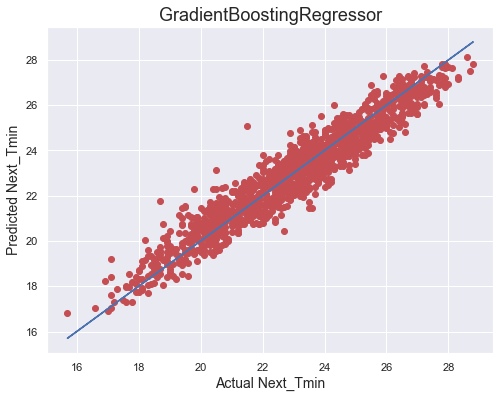

In [119]:
plt.figure(figsize=(8,6))
plt.scatter(x=y2test, y=pred_gradient2, color='r')
plt.plot(y2test,y2test, color='b')
plt.xlabel('Actual Next_Tmin',fontsize=14)
plt.ylabel('Predicted Next_Tmin',fontsize=14)
plt.title('GradientBoostingRegressor',fontsize=18)
plt.show()

# Support vector Regression

# Y1=Next_Tmax


In [120]:
from sklearn.svm import SVR

parameters = { 'kernel': ['linear', 'poly','rbf', 'sigmoid'] ,'gamma': ['auto', 'scale'],'cache_size':[50,100,200,300]}
sv = SVR()
clf = GridSearchCV(sv,parameters)
clf.fit(xtrain,y1train)

print(clf.best_params_)

{'cache_size': 50, 'gamma': 'auto', 'kernel': 'linear'}


In [121]:
sv = SVR(kernel = 'linear', gamma = 'auto',cache_size= 50)
sv.fit(xtrain,y1train)
sv.score(xtrain,y1train)
pred_vector1 = sv.predict(xtest)

for j in range(2,10):
    print("At cv:-",j)


    svs = r2_score(y1test,pred_vector1)
    print('R2 Score:',svs*100)

    svscore = cross_val_score(sv,x,y1,cv=j)
    svc = svscore.mean() 
    print('Cross Val Score:',svc*100)

At cv:- 2
R2 Score: -0.9696161605463827
Cross Val Score: 61.32398049372696
At cv:- 3
R2 Score: -0.9696161605463827
Cross Val Score: 64.97013729770235
At cv:- 4
R2 Score: -0.9696161605463827
Cross Val Score: 63.47737980940041
At cv:- 5
R2 Score: -0.9696161605463827
Cross Val Score: 63.69775580950036
At cv:- 6
R2 Score: -0.9696161605463827
Cross Val Score: 63.10993708688228
At cv:- 7
R2 Score: -0.9696161605463827
Cross Val Score: 61.8791066976785
At cv:- 8
R2 Score: -0.9696161605463827
Cross Val Score: 62.36270341587809
At cv:- 9
R2 Score: -0.9696161605463827
Cross Val Score: 58.241259978342306


In [122]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y1test,pred_vector1))
print('Mean Squared Error:',mean_squared_error(y1test,pred_vector1))
print('Root Mean Square Error:',np.sqrt(mean_squared_error(y1test,pred_vector1)))


Error:
Mean Absolute Error: 2.4228104483367816
Mean Squared Error: 8.801432663662801
Root Mean Square Error: 2.9667208604219577


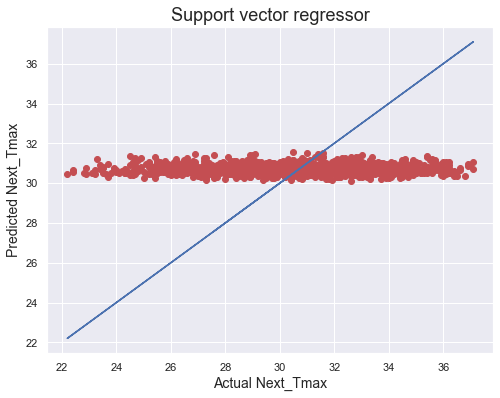

In [123]:
plt.figure(figsize=(8,6))
plt.scatter(x=y1test, y=pred_vector1, color='r')
plt.plot(y1test,y1test, color='b')
plt.xlabel('Actual Next_Tmax',fontsize=14)
plt.ylabel('Predicted Next_Tmax',fontsize=14)
plt.title('Support vector regressor',fontsize=18)
plt.show()


# Y2=Next_Tmin

In [124]:
from sklearn.svm import SVR

parameters = { 'kernel': ['linear', 'poly','rbf', 'sigmoid'] ,'gamma': ['auto', 'scale'],'cache_size':[50,100,200,300]}
sv = SVR()
clf = GridSearchCV(sv,parameters)
clf.fit(xtrain,y2train)

print(clf.best_params_)

{'cache_size': 50, 'gamma': 'auto', 'kernel': 'rbf'}


In [125]:
sv = SVR(kernel = 'rbf', gamma = 'auto',cache_size= 50)
sv.fit(xtrain,y2train)
sv.score(xtrain,y2train)
pred_vector2 = sv.predict(xtest)

for j in range(2,10):
    print("At cv:-",j)


    svs = r2_score(y2test,pred_vector2)
    print('R2 Score:',svs*100)

    svscore = cross_val_score(sv,x,y2,cv=j)
    svc = svscore.mean() 
    print('Cross Val Score:',svc*100)

At cv:- 2
R2 Score: 90.26333471855827
Cross Val Score: 73.7118391798901
At cv:- 3
R2 Score: 90.26333471855827
Cross Val Score: 70.7724873511764
At cv:- 4
R2 Score: 90.26333471855827
Cross Val Score: 73.05061381117626
At cv:- 5
R2 Score: 90.26333471855827
Cross Val Score: 72.46854213942298
At cv:- 6
R2 Score: 90.26333471855827
Cross Val Score: 68.89538848445754
At cv:- 7
R2 Score: 90.26333471855827
Cross Val Score: 70.45371345688365
At cv:- 8
R2 Score: 90.26333471855827
Cross Val Score: 72.04414133508179
At cv:- 9
R2 Score: 90.26333471855827
Cross Val Score: 64.99474163428278


In [126]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y2test,pred_vector2))
print('Mean Squared Error:',mean_squared_error(y2test,pred_vector2))
print('Root Mean Square Error:',np.sqrt(mean_squared_error(y2test,pred_vector2)))


Error:
Mean Absolute Error: 0.5725814937219107
Mean Squared Error: 0.5422418946987522
Root Mean Square Error: 0.7363707589922024


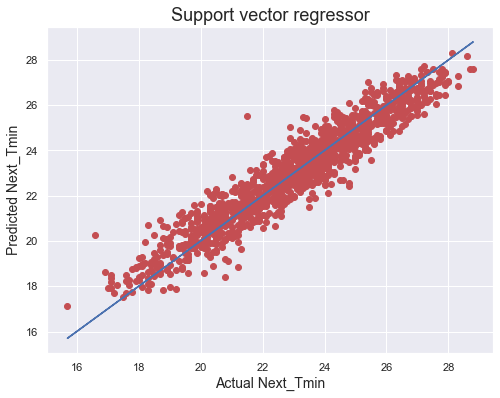

In [127]:
plt.figure(figsize=(8,6))
plt.scatter(x=y2test, y=pred_vector2, color='r')
plt.plot(y2test,y2test, color='b')
plt.xlabel('Actual Next_Tmin',fontsize=14)
plt.ylabel('Predicted Next_Tmin',fontsize=14)
plt.title('Support vector regressor',fontsize=18)
plt.show()


# KNeighborsRegressor

# Y1=Next_Tmax


In [128]:
from sklearn.neighbors import KNeighborsRegressor

parameters = { 'weights':['uniform', 'distance'] ,'algorithm':['auto', 'ball_tree', 'kd_tree', 'brute'],'n_neighbors':[5,10,15,20,25]}
kn = KNeighborsRegressor()
clf = GridSearchCV(kn,parameters)
clf.fit(xtrain,y1train)

print(clf.best_params_)

{'algorithm': 'auto', 'n_neighbors': 25, 'weights': 'uniform'}


In [129]:
kn = KNeighborsRegressor(algorithm = 'auto', weights = 'uniform',n_neighbors=25)
kn.fit(xtrain,y1train)
kn.score(xtrain,y1train)
pred_k1 = kn.predict(xtest)

for j in range(2,10):
    print("At cv:-",j)


    kns = r2_score(y1test,pred_k1)
    print('R2 Score:',kns*100)

    knscore = cross_val_score(kn,x,y1,cv=j)
    kvc = knscore.mean() 
    print('Cross Val Score:',kvc*2)

At cv:- 2
R2 Score: -6.318573475164602
Cross Val Score: 0.9439188953340373
At cv:- 3
R2 Score: -6.318573475164602
Cross Val Score: 1.0684159662867951
At cv:- 4
R2 Score: -6.318573475164602
Cross Val Score: 1.0243194786878578
At cv:- 5
R2 Score: -6.318573475164602
Cross Val Score: 1.0330143788020036
At cv:- 6
R2 Score: -6.318573475164602
Cross Val Score: 1.032878293425476
At cv:- 7
R2 Score: -6.318573475164602
Cross Val Score: 1.0050387390392392
At cv:- 8
R2 Score: -6.318573475164602
Cross Val Score: 1.015426093474272
At cv:- 9
R2 Score: -6.318573475164602
Cross Val Score: 0.9048716439873975


In [130]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y1test,pred_k1))
print('Mean Squared Error:',mean_squared_error(y1test,pred_k1))
print('Root Mean Square Error:',np.sqrt(mean_squared_error(y1test,pred_k1)))


Error:
Mean Absolute Error: 2.488540059347181
Mean Squared Error: 9.267696569732937
Root Mean Square Error: 3.044289173145833


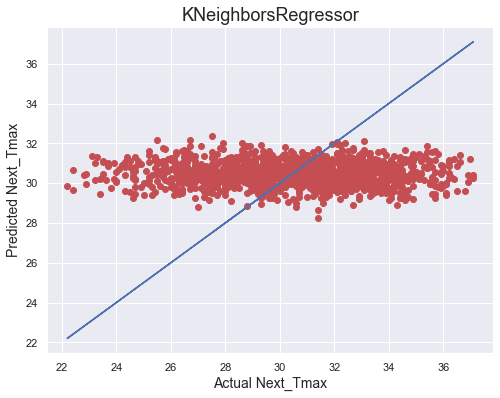

In [131]:
plt.figure(figsize=(8,6))
plt.scatter(x=y1test, y=pred_k1, color='r')
plt.plot(y1test,y1test, color='b')
plt.xlabel('Actual Next_Tmax',fontsize=14)
plt.ylabel('Predicted Next_Tmax',fontsize=14)
plt.title('KNeighborsRegressor',fontsize=18)
plt.show()


# Y2=Next_Tmin

In [132]:
from sklearn.neighbors import KNeighborsRegressor

parameters = { 'weights':['uniform', 'distance'] ,'algorithm':['auto', 'ball_tree', 'kd_tree', 'brute'],'n_neighbors':[5,10,15,20,25]}
kn = KNeighborsRegressor()
clf = GridSearchCV(kn,parameters)
clf.fit(xtrain,y2train)

print(clf.best_params_)

{'algorithm': 'auto', 'n_neighbors': 5, 'weights': 'distance'}


In [133]:
kn = KNeighborsRegressor(algorithm = 'auto', weights = 'distance',n_neighbors=5)
kn.fit(xtrain,y2train)
kn.score(xtrain,y2train)
pred_k2 = kn.predict(xtest)

for j in range(2,10):
    print("At cv:-",j)


    kns = r2_score(y2test,pred_k2)
    print('R2 Score:',kns*100)

    knscore = cross_val_score(kn,x,y2,cv=j)
    kvc = knscore.mean() 
    print('Cross Val Score:',kvc*2)

At cv:- 2
R2 Score: 85.99557145668011
Cross Val Score: 1.1435872879995133
At cv:- 3
R2 Score: 85.99557145668011
Cross Val Score: 1.1146908418855577
At cv:- 4
R2 Score: 85.99557145668011
Cross Val Score: 1.182802397822516
At cv:- 5
R2 Score: 85.99557145668011
Cross Val Score: 1.1897591962717926
At cv:- 6
R2 Score: 85.99557145668011
Cross Val Score: 1.1077756211710887
At cv:- 7
R2 Score: 85.99557145668011
Cross Val Score: 1.1385525930350842
At cv:- 8
R2 Score: 85.99557145668011
Cross Val Score: 1.2000423614723132
At cv:- 9
R2 Score: 85.99557145668011
Cross Val Score: 0.9644692306229348


In [134]:
print('Error:')

print('Mean Absolute Error:',mean_absolute_error(y2test,pred_k2))
print('Mean Squared Error:',mean_squared_error(y2test,pred_k2))
print('Root Mean Square Error:',np.sqrt(mean_squared_error(y2test,pred_k2)))


Error:
Mean Absolute Error: 0.677074144860352
Mean Squared Error: 0.7799167012526316
Root Mean Square Error: 0.8831289267443523


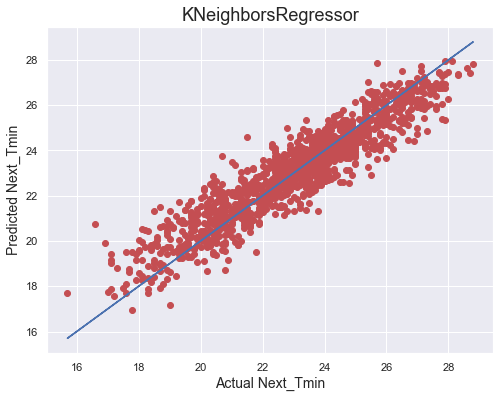

In [135]:
plt.figure(figsize=(8,6))
plt.scatter(x=y2test, y=pred_k2, color='r')
plt.plot(y2test,y2test, color='b')
plt.xlabel('Actual Next_Tmin',fontsize=14)
plt.ylabel('Predicted Next_Tmin',fontsize=14)
plt.title('KNeighborsRegressor',fontsize=18)
plt.show()


# We tested 7 models out of which Gradient Boosting Regression performing Best as Accuracy score and CV is Optimum.

# Conclusion

In [136]:
import numpy as np
a1=np.array(y1test)
a1

array([27.6, 34.8, 29.9, ..., 32.6, 28.1, 30.6])

In [137]:
import numpy as np
a2=np.array(y2test)
a2

array([21.3, 23.3, 20.4, ..., 22.9, 23.4, 21.3])

In [138]:
predicted1=np.array(pred_test1)
predicted1

array([29.54575057, 33.43533441, 30.01710279, ..., 32.89714919,
       29.38386709, 30.11200964])

In [139]:
predicted2=np.array(pred_gradient2)
predicted2

array([21.64645453, 23.52968901, 20.18505128, ..., 22.89140073,
       23.49407953, 20.85214674])

In [140]:
df_com1=pd.DataFrame({"original":a1,"predicted":predicted1}, index= range(len(a1)))
df_com1

,original,predicted
0,27.6,29.545751
1,34.8,33.435334
2,29.9,30.017103
3,25.5,28.814145
4,30.8,29.965606
...,...,...
1343,36.6,31.980334
1344,33.4,31.480886
1345,32.6,32.897149
1346,28.1,29.383867


In [141]:
df_com2=pd.DataFrame({"original":a2,"predicted":predicted2}, index= range(len(a2)))
df_com2

,original,predicted
0,21.3,21.646455
1,23.3,23.529689
2,20.4,20.185051
3,22.8,23.636994
4,22.5,23.785169
...,...,...
1343,22.5,21.513730
1344,25.3,24.443413
1345,22.9,22.891401
1346,23.4,23.494080


In [142]:
df_com1.head(10)

,original,predicted
0,27.6,29.545751
1,34.8,33.435334
2,29.9,30.017103
3,25.5,28.814145
4,30.8,29.965606
5,29.1,28.194271
6,30.1,31.055882
7,31.3,29.385426
8,32.4,33.802428
9,32.5,31.234423


In [143]:
df_com2.head(10)

,original,predicted
0,21.3,21.646455
1,23.3,23.529689
2,20.4,20.185051
3,22.8,23.636994
4,22.5,23.785169
5,18.6,19.269064
6,26.8,25.667233
7,25.0,24.523782
8,21.2,21.572481
9,22.5,22.610699


# The best model is Linear Regression for Next_Tmax. Since the difference between the percentage score of cross validation and r2_score is optimum

At random_state:- 68 Training r2_score is:- 70.71103352633983 Testing r2_score is:- 70.9310985401348

# Our Model performs with Accuracy 70.94%... Saving the best models with initials...using pickle library

In [144]:
import pickle
filename = 'Temperature Forecast_for_Next_Tmax.pkl'
pickle.dump(lr, open(filename, 'wb'))

# The best model is Gradient Boosting Regression for Next_Tmin. Since the difference between the percentage score of cross validation and r2_score is optimum.

At cv:- 2 R2 Score: 91.20004223524077 Cross Val Score: 80.57133942505507

# Our Model performs with Accuracy 91.200.74%... Saving the best models with initials...using pickle library

In [145]:
import pickle
filename = 'Temperature Forecast_for_Next_Tmin.pkl'
pickle.dump(gbr, open(filename, 'wb'))

# Summary

As mentioned in problem statment we have to predict both next dat max-temp and min temperature.
we predict both.
